In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%load_ext autoreload
%autoreload 2

In [2]:
from jax import random, vmap, jit
import jax
import jax.numpy as np
from jax.experimental import optimizers, stax
import matplotlib.pyplot as plt
from lds_svi import *
import numpy as onp
from tqdm.notebook import tnrange
from jax.flatten_util import ravel_pytree
from normalizing_flows import *

In [3]:
def gen_slice(mean, var, x_dim=25):
    x = np.linspace(0, 10, x_dim)[:,None]
    return np.exp(-0.5*np.sum((x - mean)**4.0, axis=-1)/var)

In [4]:
def simulate(N=400, T=550):
    positions = []
    pos = np.array([0.0, 10.0])
    v = np.array([1.0, 0.0])
    g = np.array([0.0, -60.0])
    dt = 0.01
    for t in np.linspace(0, T, N):
        positions.append(pos)
        pos += dt*v
        if(pos[1] <= 0):
            v *= np.array([1.0, -1.0])
            pos *= np.array([1.0, 0.0])
        v += dt*(g - (0.01*v**2)*v/np.linalg.norm(v))
        
    return np.array(positions)

In [5]:
positions = simulate()

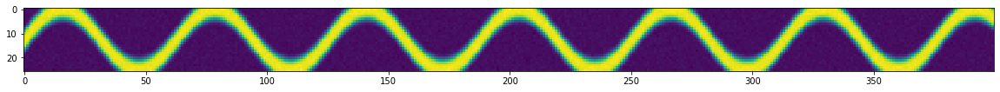

In [6]:
x_dim = 26
positions = 5*np.sin(2*np.linspace(0, 20, 400))+5
x = vmap(partial(gen_slice, x_dim=x_dim), in_axes=(0, None))(positions, 5.0)#*4
key = random.PRNGKey(0)
x += random.normal(key, x.shape)*0.01
plt.figure().set_size_inches(20, 10)
plt.imshow(x[:,::-1].T)

In [7]:
n_train = 4000
x_train = x[:n_train]
x_test = x[n_train:]
x_train.shape

(400, 26)

In [8]:
x.max()

DeviceArray(1.0276811, dtype=float32)

# Create the model

In [9]:
@partial(jit, static_argnums=(0,))
def nll(forward, params, state, x, **kwargs):
    log_px, _, state = forward(params, state, np.zeros(x.shape[0]), x, (), **kwargs)
    return -np.mean(log_px), state

@partial(jit, static_argnums=(0,))
def flat_nll(forward, params, state, x, **kwargs):
    log_px, _, state = forward(params, state, np.zeros(x.shape[0]), x, (), **kwargs)
    return -np.mean(log_px), ravel_pytree(state)[0]

@partial(jit, static_argnums=(0,))
def batched_nll(forward, params, state, x_batches, **kwargs):
    assert x_batches.ndim == 3
    nlls, flat_states = vmap(partial(flat_nll, forward, params, state, **kwargs))(x_batches)
    flat_state, unflatten = ravel_pytree(state)
    state = unflatten(np.mean(flat_states, axis=0))
    return np.mean(nlls), state

In [10]:
def get_subsequence(x, seq_size, key):
    start_idx = random.randint(key, (1,), minval=0, maxval=x.shape[0] - seq_size)[0]
    return x[start_idx:start_idx + seq_size,...]

def get_subsequence_batch(x, key, seq_size, N):
    start_idx = random.randint(key, (N,), minval=0, maxval=x.shape[1] - seq_size)
    x_batch = []
    for i in range(N):
        x_batch.append(x[start_idx[i]:start_idx[i] + seq_size,...])
    return np.array(x_batch)

In [11]:
def conv_sampler(key, shape, **kwargs):
    sigma = kwargs.get('sigma', 1.0)
    return random.normal(key, shape)*sigma

In [12]:
from jax.nn.initializers import zeros

def Transform(out_shape, n_hidden_layers=6, layer_size=2048):
    out_dim = out_shape[-1]
    # Build the s and t networks that xb will be fed into
    layer_sizes = [layer_size for _ in range(n_hidden_layers)]
#     log_s_out = spp.sequential(spp.Dense(out_dim, W_init=zeros, b_init=zeros), spp.Tanh())
    log_s_out = spp.sequential(spp.Dense(out_dim), spp.Tanh())
#     t_out = spp.sequential(spp.Dense(out_dim, W_init=zeros, b_init=zeros))
    t_out = spp.sequential(spp.Dense(out_dim))
    dense_layers = [spp.Dense(layer_size), spp.Relu()]*n_hidden_layers
    coupling_param_architecture = spp.sequential(*dense_layers, spp.FanOut(2), spp.parallel(log_s_out, t_out))
    # Split x into xa, xb and feed xb into its path
    return coupling_param_architecture

In [13]:
def train(sigma, rho, plot=False):

    n_iters = 10000
    pbar = tnrange(n_iters)
    losses = []
    seq_size = 400
    batch_size = 1
    key = random.PRNGKey(1)

    an_names = iter(['an%d'%(i) for i in range(100)])

    z_dim = 6

    flow = sequential_flow(AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform),
                           Reverse(), 
                           AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform),  
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform),
                           Reverse(), 
                           AffineCoupling(Transform), 
                           ActNorm(name=next(an_names)), 
                           Reverse(), 
                           AffineCoupling(Transform),                             
                           LDSPrior(z_dim))
    flow = Convolve(flow, conv_sampler)
    
    init_fun, forward, inverse = flow
    
    batched_valgrad = jit(jax.value_and_grad(partial(batched_nll, forward), has_aux=True))
    
    key = random.PRNGKey(1)
    input_shape = (x.shape[-1],)
    names, output_shape, params, state = init_fun(key, input_shape, ())
    
    actnorm_names = [name for name in names if 'an' in name]
    params = flow_data_dependent_init(x, actnorm_names, names, params, state, forward, (), 'actnorm_seed', key=key)
    
    opt_init, opt_update, get_params = optimizers.adam(0.0001)
    opt_update = jit(opt_update)
    opt_state = opt_init(params)
    clip_grads = jit(optimizers.clip_grads)

    try:

        for i, _ in zip(pbar, np.linspace(0.0, 0.8, n_iters)[::-1]):
            key, *keys = random.split(key, 2)

            # Sample a batch of data
            x_batch = get_subsequence_batch(x_train, key, seq_size, batch_size)

            # Compute a gradient step
            T = x_train.shape[0]
            old_state = state
            (log_px, updated_state), grad = batched_valgrad(params, state, x_batch, key=key, sigma=sigma, T=T, rho=rho)
            if(np.any(np.isnan(ravel_pytree(updated_state)[0])) == False):
                state = updated_state
            if(np.isnan(log_px)):
                assert 0
                
            log_px = log_px/seq_size/z_dim
                
            opt_state = opt_update(i, grad, opt_state)
            params = get_params(opt_state)
            
            pbar.set_description('%5.3f'%(log_px))
            losses.append(log_px)

            if(plot and i%200 == 0):
                T_test = T
                mask = (np.arange(T_test) < 100)
                mask |= (np.arange(T_test) > 300)
                _, z, _ = forward(params, state, np.zeros(T_test), x[:T_test], (), key=key, mask=mask, sigma=sigma)
                _, fz, _ = inverse(params, state, np.zeros(T_test), z, (), key=key, sigma=sigma)

                fig, axes = plt.subplots(1, 3)
                fig.set_size_inches(40, 4)
                axes[0].imshow(fz.T)

                for i in range(z.shape[1]):
                    axes[1].plot(z[:,i])
                    
                axes[0].set_title('Reconstructed data, sigma: %5.1f'%(sigma), fontsize=30)
                axes[1].set_title('Latent states, sigma: %5.1f'%(sigma), fontsize=30)
                axes[2].plot(losses[50:])
                plt.show()
    except:
        return names, forward, inverse, params, state, old_state

    mask = (np.arange(400) < 100)
    mask |= (np.arange(400) > 300)
    _, z, _ = forward(params, state, np.zeros(400), x[:400], (), key=key, sigma=sigma, mask=mask)
    _, fz, _ = inverse(params, state, np.zeros(400), z, (), key=key, sigma=sigma)

    fig, axes = plt.subplots(1, 2)
    fig.set_size_inches(40, 4)
    axes[0].imshow(fz.T)

    for i in range(z.shape[1]):
        axes[1].plot(z[:,i])
    axes[0].set_title('Reconstructed data, sigma: %5.1f'%(sigma), fontsize=30)
    axes[1].set_title('Latent states, sigma: %5.1f'%(sigma), fontsize=30)
    plt.show()
    return names, forward, inverse, params, state, old_state

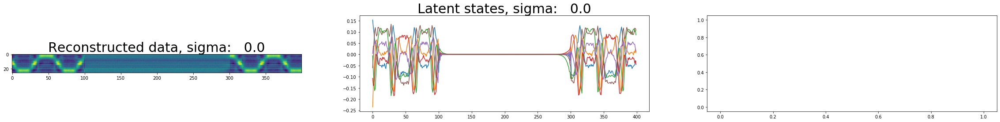

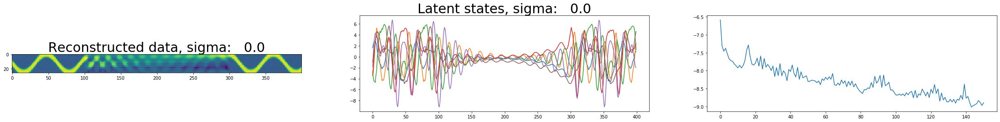

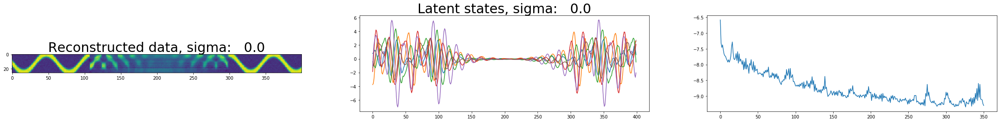

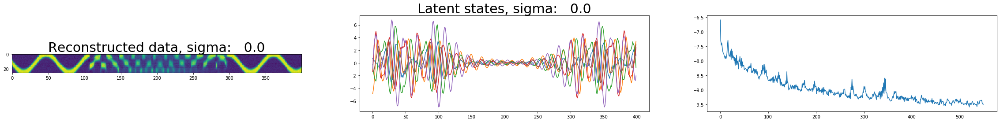

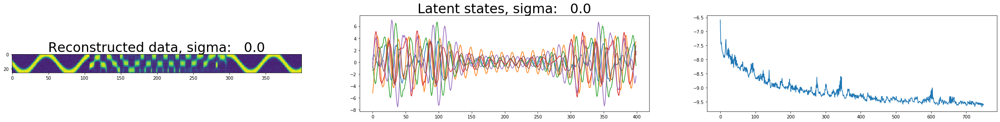

...

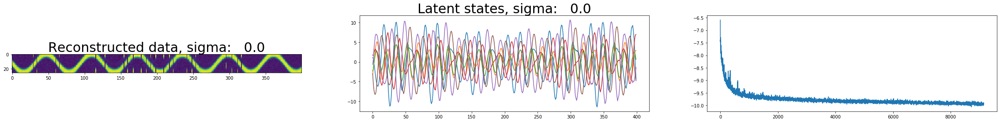

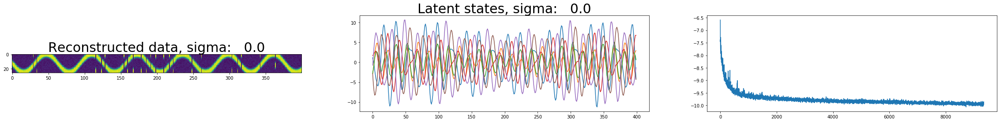

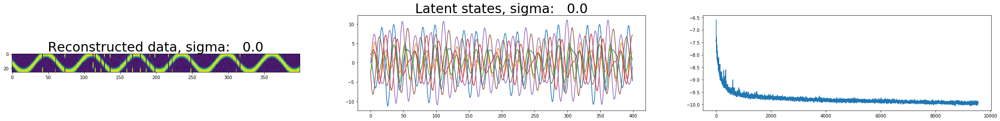

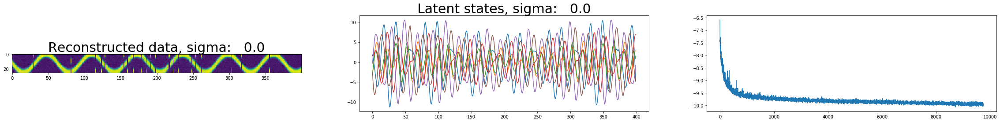

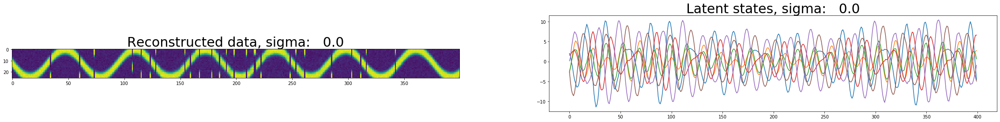

In [14]:
names, forward, inverse, params, state, old_state = train(sigma=0.02, rho=1.0, plot=True)

In [17]:
mask = (np.arange(400) < 50)
mask |= (np.arange(400) > 350)
log_px, z, _ = forward(params, state, np.zeros(x_train.shape[0]), x_train, (), key=key, sigma=0.02)
log_px, z_masked, _ = forward(params, state, np.zeros(x_train.shape[0]), x_train, (), key=key, sigma=0.02, mask=mask)
_, fz, _ = inverse(params, state, np.zeros(x_train.shape[0]), z, (), key=key, sigma=0.02)
_, fz_masked, _ = inverse(params, state, np.zeros(x_train.shape[0]), z_masked, (), key=key, sigma=0.02)

Text(0.5, 1.0, 'Predicted data conditioned on first and last 50 data points')

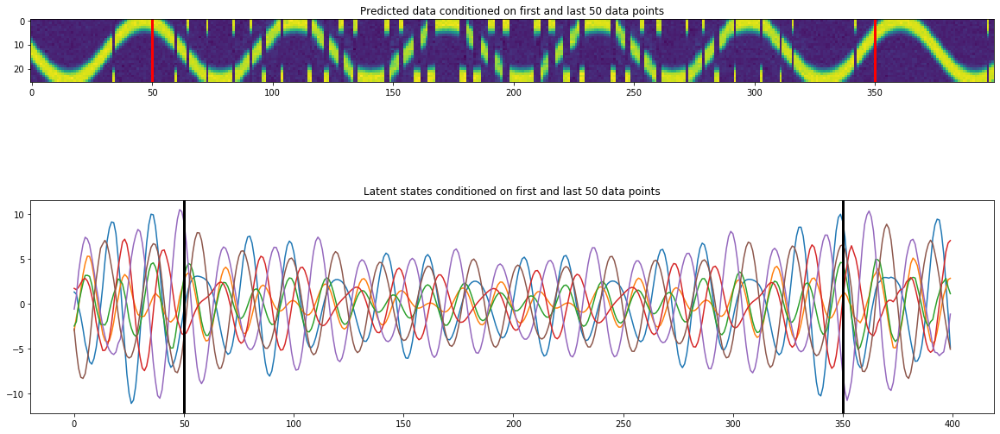

In [18]:
fig, axes = plt.subplots(2, 1); axes = axes.ravel()
fig.set_size_inches(20, 10)
for i in range(z.shape[1]):
    axes[1].plot(z_masked[:,i])
axes[1].axvline(x=50, linewidth=3, color='black')
axes[1].axvline(x=350, linewidth=3, color='black')
axes[1].set_title('Latent states conditioned on first and last 50 data points')

axes[0].imshow(fz_masked.T)
axes[0].axvline(x=50, linewidth=3, color='red')
axes[0].axvline(x=350, linewidth=3, color='red')
axes[0].set_title('Predicted data conditioned on first and last 50 data points')